In [1]:
import numpy as np
import openai
import pandas as pd
import os
import anthropic
import re
import time


# Putting together the database

In [2]:
promises = pd.read_csv("../data/sxp1500_presentations_ceo_aggregated_promises_expanded_cleaned_transcriptlevel_horizon_specificity.csv")

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_50365/2671568783.py:1: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  promises = pd.read_csv("../data/LIWC-22 Results - sxp1500_presentations_ceo_aggr___ - LIWC Analysis_v11_horizon_v2_specificity.csv")


In [3]:
# create promise_id column, it is gvkey_transcriptid_2digitnumber (01, 02, 03, ...)

promises['promise_id'] = promises.groupby(['gvkey', 'transcriptid']).cumcount() + 1
promises['promise_id'] = promises['gvkey'].astype(str) + '_' + promises['transcriptid'].astype(str) + '_' + promises['promise_id'].apply(lambda x: f'{x:02d}')



In [4]:
list(promises.columns)

['Unnamed: 0',
 'transcriptid',
 'transcriptcomponentid_list',
 'audiolengthsec',
 'companyid',
 'companyname',
 'companyofperson',
 'componentorder',
 'componenttextpreview',
 'delayreasontypeid',
 'delayreasontypename',
 'exec_fullname',
 'execid',
 'gvkey',
 'headline',
 'is_ceo',
 'isdelayed_flag',
 'keydeveventtypeid',
 'keydeveventtypename',
 'keydevid',
 'matched_name',
 'mostimportantdateutc',
 'mostimportanttimeutc',
 'proid',
 'speakertypeid',
 'speakertypename',
 'transcriptcollectiontypeid',
 'transcriptcollectiontypename',
 'transcriptcomponenttypeid',
 'transcriptcomponenttypename',
 'transcriptcreationdate_utc',
 'transcriptcreationtime_utc',
 'transcriptpersonid',
 'transcriptpersonname',
 'transcriptpresentationtypeid',
 'transcriptpresentationtypename',
 'word_count',
 'year',
 'transcript_text_len',
 'transcriptcomponentid_ceospeech',
 'processed',
 '3-promise-horizon-v2',
 '1-promise-verbatim',
 '2-promise-explain',
 '3-promise-delivery-time',
 '4-promise-horizon',


In [5]:
promises_select = promises[['gvkey', 'mostimportantdateutc', 'companyname', 'exec_fullname', 'promise_id','1-promise-verbatim' ,'2-promise-explain' ,'3-promise-horizon-v2', 'specificity_score']].sort_values(by=['gvkey', 'mostimportantdateutc',])



In [6]:
promises_select.to_csv("../data/sxp1500_presentations_ceo_aggregated_promises_expanded_cleaned_transcriptlevel_horizon_specificity_specificity_select.csv", index=False)

In [7]:
labels = pd.read_csv("promises_with_keywords_v5_labels.csv")

In [8]:
labels.columns

Index(['transcriptid', 'companyname', 'gvkey', 'transcript_date',
       'speaker_name', 'presentation_len', 'year', 'full_transcript_len',
       'promise_verbatim', 'promise_explain', 'promise_id',
       'promise_horizon_months', 'keywords', 'keyword1', 'keyword2',
       'keyword3', 'keyword1_label', 'keyword2_label', 'keyword3_label',
       'primary_keyword'],
      dtype='object')

In [9]:
labels['promise_id']

0          10353_45212.0_05
1          11600_45248.0_01
2          25338_45259.0_01
3          25338_45259.0_02
4         146017_45297.0_01
                ...        
74012    66065_2875107.0_01
74013     1598_2875128.0_01
74014     6386_2875370.0_02
74015    66065_2875419.0_01
74016    66065_2875419.0_03
Name: promise_id, Length: 74017, dtype: object

In [10]:
def revert_promise_id(promise_id):
    # Split the promise_id into parts separated by underscore
    parts = promise_id.split('_')
    fixed_parts = []
    for part in parts:
        # If the part ends with '.0', convert it to an integer string
        if part.endswith('.0'):
            part = str(int(float(part)))
        fixed_parts.append(part)
    # Rejoin the parts with underscores
    return '_'.join(fixed_parts)

# Apply the function to the promise_id column
labels['promise_id'] = labels['promise_id'].apply(revert_promise_id)

In [11]:
labels['promise_id']

0          10353_45212_05
1          11600_45248_01
2          25338_45259_01
3          25338_45259_02
4         146017_45297_01
               ...       
74012    66065_2875107_01
74013     1598_2875128_01
74014     6386_2875370_02
74015    66065_2875419_01
74016    66065_2875419_03
Name: promise_id, Length: 74017, dtype: object

In [12]:
labels = labels[['promise_id', 'primary_keyword']]

# merge promises and labels on promise_id
promises = pd.merge(labels, promises, on=['promise_id'], how='left')

In [13]:
reg_database = pd.read_csv("../data/sxp1500_presentations_ceo_aggregated_regression_vars.csv")

In [14]:
# Calculate earnings surprise price
reg_database['earnings_surprise_price'] = reg_database['earnings_surprise'] / reg_database['prccq']

# Using missed_forecast dummy
reg_database['miss_forecasts'] = 0
reg_database.loc[reg_database['earnings_surprise_price'] < 0, 'miss_forecasts'] = 1

In [15]:
reg_database = reg_database[['transcriptid', 'mostimportantdateutc', 'year', 'gvkey', 'companyname', 'execid', 'exec_fullname', 'ceo_tenure',  'ceo_gender_dummy',     'PRisk', 
    'trailing_12month_uncertainty_3component', 'uncertainty_ratio', 'fin_slack_raw','functional_background', 'at_log', 'firm_age', 'numest', 'EPS','earnings_surprise_price', 'miss_forecasts',  'earnings_volatility', 'leverage', 'rd_f', 'n_segments', 'market_share_sich4', 'strategy_unique', 'mergers', 'ceo_total_shares_owned_log', 'ceo_dual_dummy', 'positive_ratio', 'word_count_total_log', 'hhi_sich4_reverse_ind', 'sich4']]

In [16]:
reg_database['functional_background'].value_counts()

functional_background
Other/Unclear                             12472
Operations/Supply Chain                   11594
Finance/Accounting                         4791
Sales/Marketing                            1696
Technology/Product/Engineering/Science      774
Strategy                                    646
Legal/Compliance/Regulatory/Risk            566
Administrative                              188
Human Resources                              42
Name: count, dtype: int64

In [17]:
# merge using transcriptid
# make sure trascript id is int 
reg_database['transcriptid'] = reg_database['transcriptid'].astype(int)
promises['transcriptid'] = promises['transcriptid'].astype(int)
df_reg = promises.merge(reg_database, on="transcriptid", how="left")
df_reg.head()





,promise_id,primary_keyword,Unnamed: 0,transcriptid,transcriptcomponentid_list,audiolengthsec,companyid,companyname_x,companyofperson,componentorder,...,n_segments,market_share_sich4,strategy_unique,mergers,ceo_total_shares_owned_log,ceo_dual_dummy,positive_ratio,word_count_total_log,hhi_sich4_reverse_ind,sich4
0,10353_45212_05,Shareholder and Stakeholder Trust and Engagement,7,45212,"[3457811.0, 3457813.0]",3600.0,189424,"Team, Inc.",NaN,2,...,1.0,1.000000,0.000000,0.000,7.024293,1.0,0.021483,7.544332,0.000000,7600.0
1,11600_45248_01,Risk Management,9,45248,"[3460066.0, 3460069.0]",3480.0,314750,"Worthington Industries, Inc.",NaN,3,...,4.0,0.608182,0.024807,-0.232,9.213694,1.0,0.039711,6.302619,0.578956,3310.0
2,25338_45259_01,Experience Enhancement,10,45259,[3460878.0],2820.0,321778,Bed Bath & Beyond Inc.,NaN,4,...,1.0,0.544077,0.023555,0.000,6.777061,0.0,0.025852,6.709304,0.623534,5700.0
3,25338_45259_02,Investment,11,45259,[3460878.0],2820.0,321778,Bed Bath & Beyond Inc.,NaN,4,...,1.0,0.544077,0.023555,0.000,6.777061,0.0,0.025852,6.709304,0.623534,5700.0
4,146017_45297_01,Pricing and Rate Management,13,45297,"[3463260.0, 3463262.0]",4560.0,1413208,"Acuity Brands, Inc.",NaN,3,...,1.0,0.120122,0.018702,0.000,7.087475,1.0,0.030538,7.611348,0.792453,3640.0


In [18]:
df = df_reg[['promise_id',
 'primary_keyword',
 'transcriptid',
 'companyname_x',
 'exec_fullname_y',
 'execid_y',
 'gvkey_x',
 'mostimportantdateutc_x',
 'word_count',
 'year_x',
 '3-promise-horizon-v2',
 'Analytic',
 'quantity',
 'ceo_tenure',
 'ceo_gender_dummy',
 'PRisk',
 'trailing_12month_uncertainty_3component',
 'uncertainty_ratio',
 'fin_slack_raw',
 'functional_background',
 'at_log',
 'firm_age',
 'numest',
 'EPS','earnings_surprise_price', 'miss_forecasts', 
 'earnings_volatility',
 'leverage',
 'rd_f',
 'n_segments',
 'market_share_sich4',
 'strategy_unique',
 'mergers',
 'ceo_total_shares_owned_log',
 'ceo_dual_dummy',
 'positive_ratio',
 'word_count_total_log',
 'hhi_sich4_reverse_ind', 'sich4']]

In [19]:
df['mostimportantdateutc_x'] = pd.to_datetime(df['mostimportantdateutc_x'])
df['month'] = df['mostimportantdateutc_x'].dt.month

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_50365/3658153693.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['mostimportantdateutc_x'] = pd.to_datetime(df['mostimportantdateutc_x'])
/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_50365/3658153693.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df['mostimportantdateutc_x'].dt.month


In [20]:
# in the column 3-promise-horizon-v2, turn to int, if it is not a number, make it nan
df['3-promise-horizon-clean'] = df['3-promise-horizon-v2'].apply(lambda x: int(x) if str(x).isdigit() else np.nan)

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_50365/3513871697.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['3-promise-horizon-clean'] = df['3-promise-horizon-v2'].apply(lambda x: int(x) if str(x).isdigit() else np.nan)


In [21]:
df['3-promise-horizon-clean'] 

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
74012    5.0
74013    NaN
74014    7.0
74015    NaN
74016    NaN
Name: 3-promise-horizon-clean, Length: 74017, dtype: float64

In [22]:
# what percent is nan?
df['3-promise-horizon-clean'].isna().mean()



0.5147060810354378

In [23]:
df['sich2'] = pd.to_numeric(
    df['sich4'].astype(str).str.zfill(2).str[:2], # Convert to string, pad, slice
    errors='coerce'                             # Convert back to numeric, NaNs for errors
)

# --- Step 2: Define conditions and corresponding labels ---
# Conditions now operate on the new 'sich2' column.
conditions = [
    (df['sich2'] >= 1) & (df['sich2'] <= 9),
    (df['sich2'] >= 10) & (df['sich2'] <= 14),
    (df['sich2'] >= 15) & (df['sich2'] <= 17),
    (df['sich2'] >= 20) & (df['sich2'] <= 39),
    (df['sich2'] >= 40) & (df['sich2'] <= 49),
    (df['sich2'] >= 50) & (df['sich2'] <= 51),
    (df['sich2'] >= 52) & (df['sich2'] <= 59),
    (df['sich2'] >= 60) & (df['sich2'] <= 67),
    (df['sich2'] >= 70) & (df['sich2'] <= 89),
    (df['sich2'] >= 91) & (df['sich2'] <= 99)
]

labels = [
    'Agriculture, Forestry, Fishing',
    'Mining',
    'Construction',
    'Manufacturing',
    'Transportation & Public Utilities',
    'Wholesale Trade',
    'Retail Trade',
    'Finance, Insurance, Real Estate',
    'Services',
    'Public Administration'
]

# --- Step 3: Create 'industry_label' using np.select based on 'sich2' ---
# Assign the corresponding label based on the 'sich2' value.
# Default to NaN if 'sich2' doesn't fall into any category (e.g., it was NaN).
df['industry_label'] = np.select(conditions, labels, default=np.nan)

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_50365/286254008.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sich2'] = pd.to_numeric(
/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_50365/286254008.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['industry_label'] = np.select(conditions, labels, default=np.nan)


## add non-promise transcripts

In [24]:
df_reg_all_transcripts = promises.merge(reg_database, on="transcriptid", how="outer")



In [25]:
df_reg_all_transcripts['3-promise-horizon-clean'] = df_reg_all_transcripts['3-promise-horizon-v2'].apply(lambda x: int(x) if str(x).isdigit() else np.nan)

In [26]:
df_reg_all_transcripts[f'promise_count'] = df_reg_all_transcripts.groupby(['transcriptid'])['promise_id'].transform('nunique')

    # promises deliver date averaging
df_reg_all_transcripts[f'promises_horizon'] = df_reg_all_transcripts.groupby(['transcriptid'])[f'3-promise-horizon-clean'].transform(lambda x: x.mean(skipna=True))

In [27]:
df_reg_all_transcripts[f'promise_count'].fillna(0, inplace=True)

/var/folders/qr/1pq07r555gxgt22gqksl2tlw0000gn/T/ipykernel_50365/421784538.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_reg_all_transcripts[f'promise_count'].fillna(0, inplace=True)


In [28]:
df_reg_all_transcripts['mostimportantdateutc_y'] = pd.to_datetime(df_reg_all_transcripts['mostimportantdateutc_y'])
df_reg_all_transcripts['month'] = df_reg_all_transcripts['mostimportantdateutc_y'].dt.month

In [29]:
list(df_reg_all_transcripts.columns)

['promise_id',
 'primary_keyword',
 'Unnamed: 0',
 'transcriptid',
 'transcriptcomponentid_list',
 'audiolengthsec',
 'companyid',
 'companyname_x',
 'companyofperson',
 'componentorder',
 'componenttextpreview',
 'delayreasontypeid',
 'delayreasontypename',
 'exec_fullname_x',
 'execid_x',
 'gvkey_x',
 'headline',
 'is_ceo',
 'isdelayed_flag',
 'keydeveventtypeid',
 'keydeveventtypename',
 'keydevid',
 'matched_name',
 'mostimportantdateutc_x',
 'mostimportanttimeutc',
 'proid',
 'speakertypeid',
 'speakertypename',
 'transcriptcollectiontypeid',
 'transcriptcollectiontypename',
 'transcriptcomponenttypeid',
 'transcriptcomponenttypename',
 'transcriptcreationdate_utc',
 'transcriptcreationtime_utc',
 'transcriptpersonid',
 'transcriptpersonname',
 'transcriptpresentationtypeid',
 'transcriptpresentationtypename',
 'word_count',
 'year_x',
 'transcript_text_len',
 'transcriptcomponentid_ceospeech',
 'processed',
 '3-promise-horizon-v2',
 '1-promise-verbatim',
 '2-promise-explain',
 '3

In [30]:
df_reg_all_transcripts_select = df_reg_all_transcripts[['promise_count', 'promises_horizon',
 'transcriptid',
 'companyname_x',
 'exec_fullname_y',
 'execid_y',
 'gvkey_x',
 'year_x',
 'year_y',
 'month',
 'ceo_tenure',
 'ceo_gender_dummy',
 'PRisk',
 'trailing_12month_uncertainty_3component',
 'uncertainty_ratio',
 'fin_slack_raw',
 'functional_background',
 'at_log',
 'firm_age',
 'numest',
 'EPS','earnings_surprise_price', 'miss_forecasts', 
 'earnings_volatility',
 'leverage',
 'rd_f',
 'n_segments',
 'market_share_sich4',
 'strategy_unique',
 'mergers',
 'ceo_total_shares_owned_log',
 'ceo_dual_dummy',
 'positive_ratio',
 'word_count_total_log',
 'hhi_sich4_reverse_ind', 'sich4']]

In [31]:
# keep first row for each transcriptid
df_reg_all_transcripts_select = df_reg_all_transcripts_select.drop_duplicates(subset=['transcriptid'], keep='first')


In [32]:
df_reg_all_transcripts_select_full = df_reg_all_transcripts.drop_duplicates(subset=['transcriptid'], keep='first')


# Explorations


In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.iolib.summary2 import summary_col



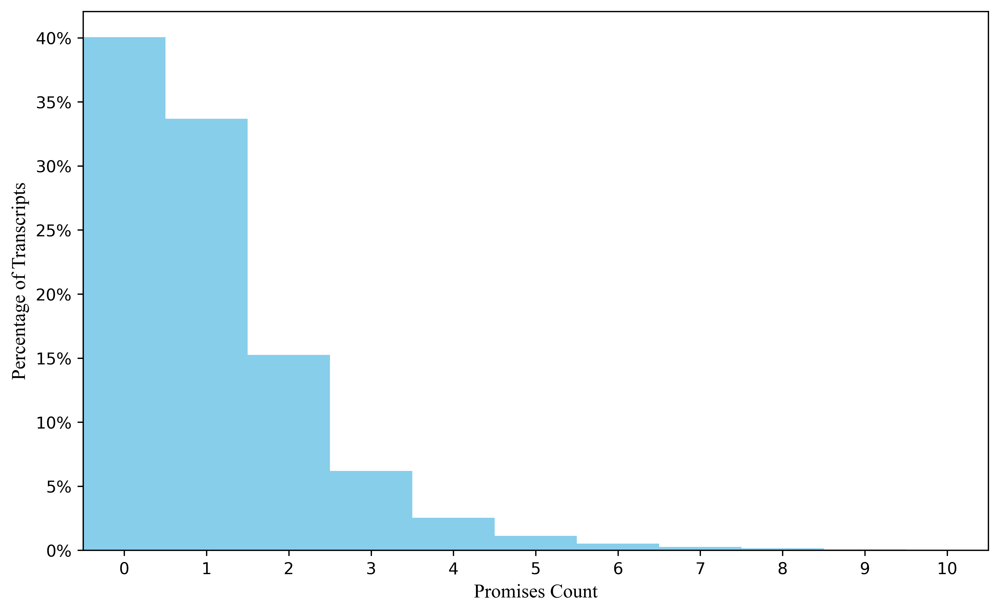

In [34]:
# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 6), dpi=600)

# Set font to Times New Roman for all text elements
plt.rcParams['font.family'] = 'Times New Roman'

# Calculate weights for each data point to create a percentage-based histogram
weights = np.ones_like(df_reg_all_transcripts_select['promise_count']) / len(df_reg_all_transcripts_select['promise_count'])

# Create histogram with integer bins centered on promise count values
bins = np.arange(-0.5, 10.6, 1)  # Creates bins centered on integers 0,1,2,...,10
plt.hist(df_reg_all_transcripts_select['promise_count'], bins=bins, weights=weights, color='skyblue', align='mid')

# Set x-ticks to show all integer values
plt.xticks(range(0, 11))

# Set title and labels with Times New Roman font
plt.xlabel('Promises Count', fontsize=12, fontfamily='Times New Roman')
plt.ylabel('Percentage of Transcripts', fontsize=12, fontfamily='Times New Roman')

# Convert y-axis into percentage
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: '{:.0%}'.format(x)))  

# Limit x axis
plt.xlim([-0.5, 10.5])

# Save figure with high quality
plt.savefig('../data/figures_v2/promises_count_distribution.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.show()

In [35]:
df_reg_all_transcripts_select['promise_count'].describe()

count    69167.000000
mean         1.070120
std          1.311567
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         25.000000
Name: promise_count, dtype: float64

In [36]:
# what percent of transcript_id, promise_count is zero?
len(df_reg_all_transcripts_select[df_reg_all_transcripts_select['promise_count']==0]) / len(df_reg_all_transcripts_select)

0.4004944554484075

In [37]:
len(df_reg_all_transcripts_select[df_reg_all_transcripts_select['promise_count']==1]) / len(df_reg_all_transcripts_select)

0.3368947619529544

Number of rows in grouped data: 31
   ceo_tenure  promise_count
0         1.0       1.259577
1         2.0       1.171492
2         3.0       1.141462
3         4.0       1.108108
4         5.0       1.055675


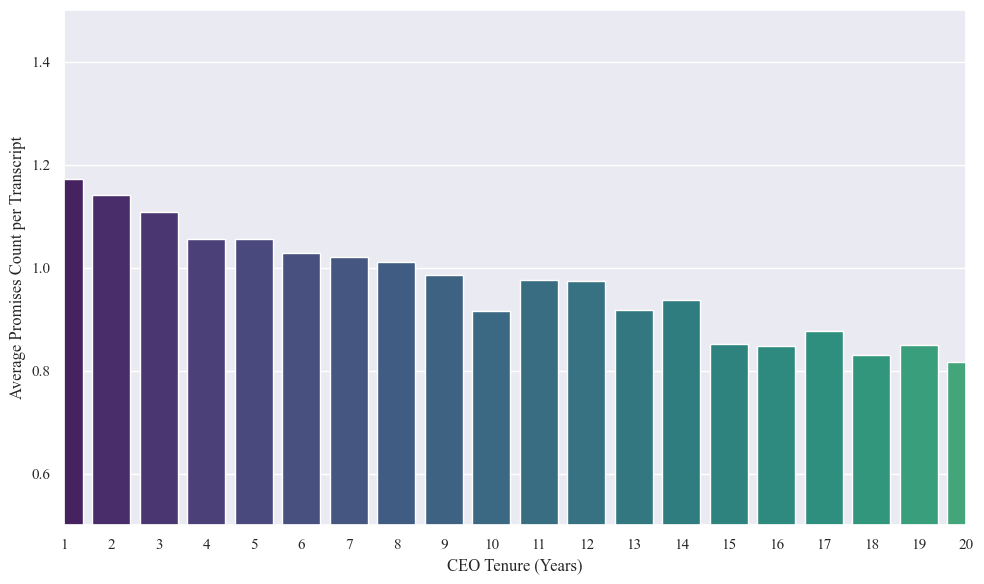

In [38]:
# Set theme
sns.set_theme()

# Set font to Times New Roman for all text elements
plt.rcParams['font.family'] = 'Times New Roman'

# promise_count by ceo_tenure visualization - filter out tenure 0
filtered_df = df_reg_all_transcripts_select[df_reg_all_transcripts_select['ceo_tenure'] > 0]
grouped_df = filtered_df.groupby('ceo_tenure')['promise_count'].mean().reset_index()

# Check if we have data
print(f"Number of rows in grouped data: {len(grouped_df)}")
print(grouped_df.head())

# Create figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Barplot using seaborn
sns.barplot(x='ceo_tenure', y='promise_count', data=grouped_df, palette='viridis', ax=ax)

# Set title and labels with Times New Roman font
ax.set_xlabel('CEO Tenure (Years)', fontsize=12, fontfamily='Times New Roman')
ax.set_ylabel('Average Promises Count per Transcript', fontsize=12, fontfamily='Times New Roman')

# Set xlim and ylim to focus on the variation
ax.set_xlim([1, 20])
ax.set_ylim([0.5, 1.5])  # Set y-axis limits to show variation better

# Set x-ticks to integers
integer_ticks = np.arange(1, 21)  # Start from 1 instead of 0
ax.set_xticks(integer_ticks)
ax.set_xticklabels([f"{int(x)}" for x in integer_ticks], fontfamily='Times New Roman')

# Show the plot
plt.tight_layout()
plt.show()

In [39]:
# Create a dataframe with CEOs, their IDs, companies, and median promise counts per company
ceo_company_promises = df_reg_all_transcripts_select_full.groupby(['execid_y', 'gvkey_y']).agg({
    'exec_fullname_y': 'first',
    'companyname_y': 'first',
    'promise_count': 'mean',
    'transcriptid': 'nunique'
}).reset_index()

# The column name after aggregation is 'transcriptid' not 'transcriptid_nunique'
ceo_company_promises['years_in_company'] = ceo_company_promises['transcriptid']

# Flatten the multi-level columns
ceo_company_promises.columns = ['_'.join(col).strip('_') if isinstance(col, tuple) else col for col in ceo_company_promises.columns]

# Rename columns for clarity
ceo_company_promises = ceo_company_promises.rename(columns={
    'execid_y': 'CEO ID',
    'gvkey_y': 'Company ID',
    'exec_fullname_y': 'CEO Name',
    'companyname_y': 'Company Name',
    'promise_count': 'Median Promise Count',
    'transcriptid': 'Years in Company'
})

# Sort by median promise count in descending order
ceo_company_promises = ceo_company_promises.sort_values('Median Promise Count', ascending=False)

# Display the dataframe
print(f"Number of unique CEO-Company pairs: {len(ceo_company_promises)}")
print(ceo_company_promises[['CEO ID', 'Company ID', 'CEO Name', 'Company Name', 'Median Promise Count', 'Years in Company']].head(10))

Number of unique CEO-Company pairs: 3509
       CEO ID  Company ID               CEO Name                 Company Name  \
668   21241.0      4108.0       Lewis Mark Kling        Flowserve Corporation   
2162  44174.0     64891.0         Stefan Larsson     Ralph Lauren Corporation   
3207  59316.0      3980.0       Robert A. Chapek      The Walt Disney Company   
2250  45235.0     25283.0       Michelle D. Gass           Kohl's Corporation   
1093  28542.0      5071.0      Kendall J. Powell          General Mills, Inc.   
1191  29718.0     13714.0     Robert Marc Bakish             Paramount Global   
1962  41884.0     14309.0             Jean Madar          Inter Parfums, Inc.   
2204  44810.0     16721.0          Andrew Wilson         Electronic Arts Inc.   
191    8749.0      6158.0  A. Malachi Mixon, III         Invacare Corporation   
200    9176.0     11944.0      Brady J. Churches  Tuesday Morning Corporation   

      Median Promise Count  Years in Company  
668               7.

In [40]:
df_reg_all_transcripts_select_full['promise_count'].describe()

count    69167.000000
mean         1.070120
std          1.311567
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         25.000000
Name: promise_count, dtype: float64

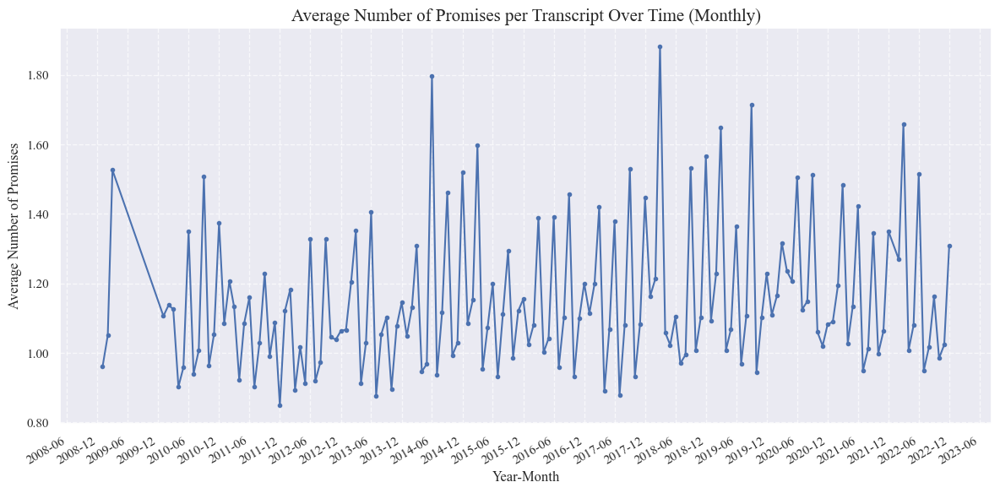

In [41]:
import matplotlib.dates as mdates
# Calculate average promises per transcript for each year-month combination
# Fix the format to ensure proper date conversion - handle NaN values
df_reg_all_transcripts_select['year'] = df_reg_all_transcripts_select['year_y'].fillna(0).astype(int)
df_reg_all_transcripts_select['month_num'] = df_reg_all_transcripts_select['month'].fillna(1).astype(int)

# Filter out rows with invalid year/month values (those that were NaN)
valid_dates = (df_reg_all_transcripts_select['year'] > 0)
df_dates = df_reg_all_transcripts_select[valid_dates].copy()

# Create datetime column for valid dates - fix the month column name issue
# pd.to_datetime requires 'month' not 'month_num' when using dictionary-like input
df_dates['year_month'] = pd.to_datetime({
    'year': df_dates['year'],
    'month': df_dates['month_num'],
    'day': 1
})

monthly_avg_promises = df_dates.groupby('year_month')['promise_count'].mean().reset_index()

# Sort by year_month to ensure chronological order
monthly_avg_promises = monthly_avg_promises.sort_values('year_month')

# Create figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Create the line plot
plt.plot(monthly_avg_promises['year_month'], monthly_avg_promises['promise_count'], marker='.', linewidth=1.5, markersize=6)

# Set title and labels
plt.title('Average Number of Promises per Transcript Over Time (Monthly)', fontsize=15)
plt.xlabel('Year-Month', fontsize=12)
plt.ylabel('Average Number of Promises', fontsize=12)

# Format x-axis to show dates nicely
plt.gcf().autofmt_xdate()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Format y-axis to show decimals
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: '{:.2f}'.format(x)))

# Adjust layout to prevent label cutoff
plt.tight_layout()

plt.show()

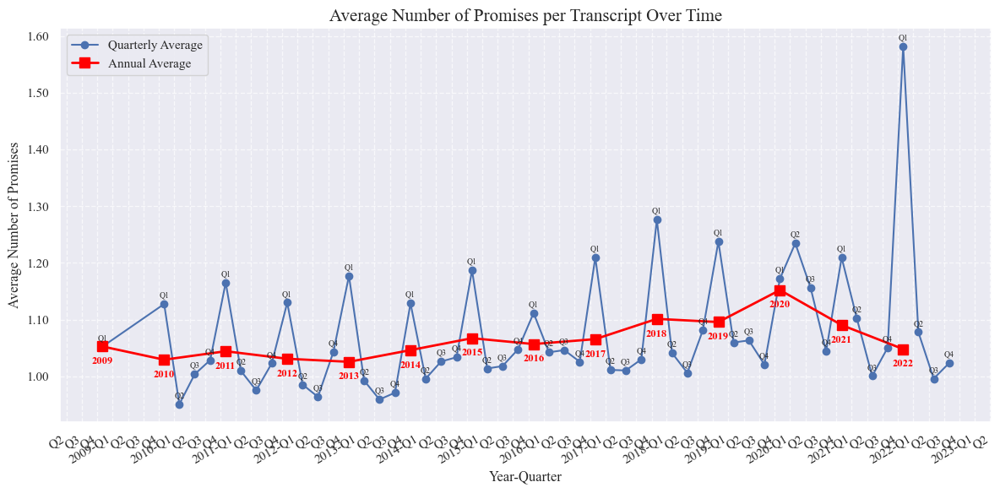

In [42]:
import matplotlib.dates as mdates
# Calculate average promises per transcript for each quarter combination
# Fix the format to ensure proper date conversion - handle NaN values
df_reg_all_transcripts_select['year'] = df_reg_all_transcripts_select['year_y'].fillna(0).astype(int)
df_reg_all_transcripts_select['month_num'] = df_reg_all_transcripts_select['month'].fillna(1).astype(int)

# Filter out rows with invalid year/month values (those that were NaN)
valid_dates = (df_reg_all_transcripts_select['year'] > 0)
df_dates = df_reg_all_transcripts_select[valid_dates].copy()

# Create datetime column for valid dates
df_dates['year_month'] = pd.to_datetime({
    'year': df_dates['year'],
    'month': df_dates['month_num'],
    'day': 1
})

# Add quarter information
df_dates['quarter'] = df_dates['year_month'].dt.to_period('Q')
# Add year information
df_dates['year_period'] = df_dates['year_month'].dt.to_period('Y')

# Calculate quarterly average promises
quarterly_avg_promises = df_dates.groupby('quarter')['promise_count'].mean().reset_index()

# Calculate annual average promises
annual_avg_promises = df_dates.groupby('year_period')['promise_count'].mean().reset_index()

# Convert period to datetime for plotting
quarterly_avg_promises['quarter_start'] = quarterly_avg_promises['quarter'].dt.start_time
annual_avg_promises['year_start'] = annual_avg_promises['year_period'].dt.start_time

# Sort by quarter/year to ensure chronological order
quarterly_avg_promises = quarterly_avg_promises.sort_values('quarter_start')
annual_avg_promises = annual_avg_promises.sort_values('year_start')

# Create figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Create the quarterly line plot
line_quarterly = plt.plot(quarterly_avg_promises['quarter_start'], quarterly_avg_promises['promise_count'], 
         marker='o', linewidth=1.5, markersize=6, label='Quarterly Average')[0]

# Create the annual line plot
line_annual = plt.plot(annual_avg_promises['year_start'], annual_avg_promises['promise_count'], 
         marker='s', linewidth=2, markersize=8, color='red', label='Annual Average')[0]

# Add quarter labels to each point
for i, (date, count, quarter) in enumerate(zip(
    quarterly_avg_promises['quarter_start'], 
    quarterly_avg_promises['promise_count'],
    quarterly_avg_promises['quarter'])):
    quarter_label = f"Q{quarter.quarter}"
    plt.annotate(quarter_label, 
                 (date, count),
                 xytext=(0, 5),  # Small offset above the point
                 textcoords='offset points',
                 ha='center',
                 fontsize=7)  # Small font size

# Add year labels to annual points
for i, (date, count, year) in enumerate(zip(
    annual_avg_promises['year_start'], 
    annual_avg_promises['promise_count'],
    annual_avg_promises['year_period'])):
    year_label = f"{year.year}"
    plt.annotate(year_label, 
                 (date, count),
                 xytext=(0, -15),  # Small offset below the point
                 textcoords='offset points',
                 ha='center',
                 fontsize=9,
                 color='red',
                 fontweight='bold')

# Set title and labels
plt.title('Average Number of Promises per Transcript Over Time', fontsize=15)
plt.xlabel('Year-Quarter', fontsize=12)
plt.ylabel('Average Number of Promises', fontsize=12)

# Format x-axis to show dates nicely
plt.gcf().autofmt_xdate()
# Custom formatter to show only Q1 for readability
def quarter_formatter(x, pos=None):
    date = mdates.num2date(x)
    quarter = (date.month-1)//3 + 1
    if quarter == 1:
        return f"{date.year}-Q{quarter}"
    else:
        return f"Q{quarter}"

ax.xaxis.set_major_formatter(plt.FuncFormatter(quarter_formatter))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Format y-axis to show decimals
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: '{:.2f}'.format(x)))

# Add legend
plt.legend(loc='best')

# Adjust layout to prevent label cutoff
plt.tight_layout()

plt.show()

In [43]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set Times New Roman font
rcParams['font.family'] = 'Times New Roman'


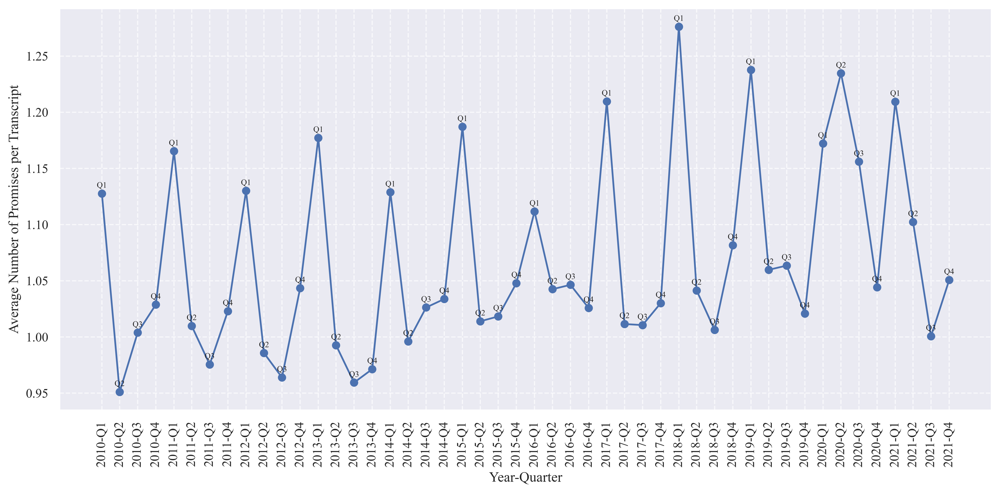

In [44]:

# Calculate average promises per transcript for each quarter combination
# Fix the format to ensure proper date conversion - handle NaN values
df_reg_all_transcripts_select['year'] = df_reg_all_transcripts_select['year_y'].fillna(0).astype(int)
df_reg_all_transcripts_select['month_num'] = df_reg_all_transcripts_select['month'].fillna(1).astype(int)

# Filter out rows with invalid year/month values (those that were NaN)
valid_dates = (df_reg_all_transcripts_select['year'] > 0)
df_dates = df_reg_all_transcripts_select[valid_dates].copy()

# Create datetime column for valid dates
df_dates['year_month'] = pd.to_datetime({
    'year': df_dates['year'],
    'month': df_dates['month_num'],
    'day': 1
})

# Add quarter information
df_dates['quarter'] = df_dates['year_month'].dt.to_period('Q')

# Calculate quarterly average promises
quarterly_avg_promises = df_dates.groupby('quarter')['promise_count'].mean().reset_index()

# Convert period to datetime for plotting
quarterly_avg_promises['quarter_start'] = quarterly_avg_promises['quarter'].dt.start_time

# Sort by quarter to ensure chronological order
quarterly_avg_promises = quarterly_avg_promises.sort_values('quarter_start')

# Filter data from 2010 to 2021 Q4
start_date = pd.Timestamp('2010-01-01')
end_date = pd.Timestamp('2021-12-31')
quarterly_avg_promises = quarterly_avg_promises[
    (quarterly_avg_promises['quarter_start'] >= start_date) & 
    (quarterly_avg_promises['quarter_start'] <= end_date)
]

# Create figure and axes
fig, ax = plt.subplots(figsize=(12, 6), dpi=600)

# Create x-axis ticks at the exact quarter starts
x_ticks = quarterly_avg_promises['quarter_start']

# Create the line plot using the exact tick positions
line = plt.plot(x_ticks, quarterly_avg_promises['promise_count'], 
         marker='o', linewidth=1.5, markersize=6)[0]

# Add quarter labels to each point
for i, (date, count, quarter) in enumerate(zip(
    x_ticks, 
    quarterly_avg_promises['promise_count'],
    quarterly_avg_promises['quarter'])):
    quarter_label = f"Q{quarter.quarter}"
    plt.annotate(quarter_label, 
                 (date, count),
                 xytext=(0, 5),  # Small offset above the point
                 textcoords='offset points',
                 ha='center',
                 fontsize=7)  # Small font size

# Set title and labels
plt.title('', fontsize=15)
plt.xlabel('Year-Quarter', fontsize=12)
plt.ylabel('Average Number of Promises per Transcript', fontsize=12)

# Set the exact tick positions
ax.set_xticks(x_ticks)

# Format x-axis labels
def quarter_formatter(x, pos=None):
    date = mdates.num2date(x)
    quarter = (date.month-1)//3 + 1
    return f"{date.year}-Q{quarter}"

# Apply the formatter to the exact tick positions
ax.set_xticklabels([quarter_formatter(tick) for tick in mdates.date2num(x_ticks)], rotation=90)

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Format y-axis to show decimals
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: '{:.2f}'.format(x)))

# Adjust layout to prevent label cutoff
plt.tight_layout()

plt.show()

# Exploration - topic modeling

## Exploring keywords and labels

In [45]:
df.columns

Index(['promise_id', 'primary_keyword', 'transcriptid', 'companyname_x',
       'exec_fullname_y', 'execid_y', 'gvkey_x', 'mostimportantdateutc_x',
       'word_count', 'year_x', '3-promise-horizon-v2', 'Analytic', 'quantity',
       'ceo_tenure', 'ceo_gender_dummy', 'PRisk',
       'trailing_12month_uncertainty_3component', 'uncertainty_ratio',
       'fin_slack_raw', 'functional_background', 'at_log', 'firm_age',
       'numest', 'EPS', 'earnings_surprise_price', 'miss_forecasts',
       'earnings_volatility', 'leverage', 'rd_f', 'n_segments',
       'market_share_sich4', 'strategy_unique', 'mergers',
       'ceo_total_shares_owned_log', 'ceo_dual_dummy', 'positive_ratio',
       'word_count_total_log', 'hhi_sich4_reverse_ind', 'sich4', 'month',
       '3-promise-horizon-clean', 'sich2', 'industry_label'],
      dtype='object')

In [46]:
# List of my select primary keywords
select_primary_keywords = [
    "Expansion Plans",
    "Launch Announcements",
    "Cost Reduction Initiatives",
    "Business Growth",
    "Dividend Policy",
    "Innovation",
    "Construction and Infrastructure Development",
    "Efficiency",
    "Acquisitions",
    "Investment",
    "Business Transformation",
    "Improvement Commitments",
    "Financial and Operational Discipline",
    "Marketing and Advertising Initiatives",
    "Corporate Restructuring",
    "Capacity Expansion",
    "Partnerships",
    "Experience Enhancement",
    "New Facility and Location Openings",
    "Shareholder and Stakeholder Trust and Engagement",
    "Recovery Strategies",
    "Strategic and Operational Implementation",
    "Leadership",
    "Sustainability",
    "Supply Chain Transformation and Resilience",
    "Safety Initiatives",
    "Market Positioning Strategy",
    "Emerging and advanced technologies",
    "Customer Relationship Management",
    "Clean and Renewable Energy Transition",
    "Corporate Strategic Initiatives",
    "Workforce Management and Optimization",
    "Divestitures",
    "Recruitment and Talent Acquisition",
    "Synergy",
    "Continuity",
    "Rebranding Initiatives",
    "Diversification Strategies",
    "Diversity, Equity, and Inclusion",
    "Disclosure Commitments",
    "Education and Training Initiatives",
    "Sustainable Packaging and Recycling",
    "Manufacturing and Production",
    "Omnichannel Strategy"
]

In [47]:
# Get all unique keywords across keyword1, keyword2, and keyword3 columns
labels = pd.read_csv("promises_with_keywords_v5_labels.csv")
all_keywords = set()
for col in ['keyword1', 'keyword2', 'keyword3']:
    # Skip None/NaN values
    keywords = labels[col].dropna().unique()
    all_keywords.update(keywords)

print(f"Total unique keywords across keyword1, keyword2, and keyword3: {len(all_keywords)}")


Total unique keywords across keyword1, keyword2, and keyword3: 56825


In [48]:
# how many unique keyword1 2 3 _label?
all_keywords = set()
for col in ['keyword1_label', 'keyword2_label', 'keyword3_label']:
    # Skip None/NaN values
    keywords = labels[col].dropna().unique()
    all_keywords.update(keywords)

print(f"Total unique keywords across keyword1_label, keyword2_label, and keyword3_label: {len(all_keywords)}")


Total unique keywords across keyword1_label, keyword2_label, and keyword3_label: 118


In [49]:
# Optional: remove extra whitespace from column names
labels.columns = labels.columns.str.strip()

# Create separate DataFrames for each keyword-label pair
df_kw1 = labels[['keyword1', 'keyword1_label']].rename(columns={'keyword1': 'keyword', 'keyword1_label': 'label'})
df_kw2 = labels[['keyword2', 'keyword2_label']].rename(columns={'keyword2': 'keyword', 'keyword2_label': 'label'})
df_kw3 = labels[['keyword3', 'keyword3_label']].rename(columns={'keyword3': 'keyword', 'keyword3_label': 'label'})

# Concatenate into one long DataFrame and drop missing values
df_keywords = pd.concat([df_kw1, df_kw2, df_kw3], ignore_index=True)
df_keywords = df_keywords.dropna(subset=['keyword', 'label'])

# Count occurrences per label-keyword pair
keyword_counts = df_keywords.groupby(['label', 'keyword']).size().reset_index(name='count')

# Calculate overall label frequency
label_counts = df_keywords.groupby('label').size().reset_index(name='total_count')
# Order labels by overall frequency (descending)
label_counts = label_counts.sort_values('total_count', ascending=False)

# Sort keyword counts by label and count descending
keyword_counts_sorted = keyword_counts.sort_values(['label', 'count'], ascending=[True, False])

# Create a dataframe with label, keyword, and count columns
labels_keywords_df = pd.DataFrame()
for _, row in label_counts.iterrows():
    current_label = row['label']
    label_frequency = row['total_count']
    top_keywords = keyword_counts_sorted[keyword_counts_sorted['label'] == current_label].head(100)
    
    # Create temporary dataframe with the current label
    temp_df = top_keywords[['keyword', 'count']].copy()
    temp_df['label'] = current_label
    temp_df['label_frequency'] = label_frequency
    
    # Append to the main dataframe
    labels_keywords_df = pd.concat([labels_keywords_df, temp_df], ignore_index=True)



In [50]:
len(df_keywords[df_keywords['label'] == 'Unclustered'])

72398

In [51]:
labels_keywords_df.to_csv("labels_keywords_df.csv", index=False)

In [52]:
# Import WordCloud library
from wordcloud import WordCloud

# Optional: remove extra whitespace from column names
labels.columns = labels.columns.str.strip()

# Create separate DataFrames for each keyword-label pair
df_kw1 = labels[['keyword1', 'keyword1_label']].rename(columns={'keyword1': 'keyword', 'keyword1_label': 'label'})
df_kw2 = labels[['keyword2', 'keyword2_label']].rename(columns={'keyword2': 'keyword', 'keyword2_label': 'label'})
df_kw3 = labels[['keyword3', 'keyword3_label']].rename(columns={'keyword3': 'keyword', 'keyword3_label': 'label'})

# Concatenate into one long DataFrame and drop missing values
df_keywords = pd.concat([df_kw1, df_kw2, df_kw3], ignore_index=True)
df_keywords = df_keywords.dropna(subset=['keyword', 'label'])

# Remove "Unclustered" label
df_keywords = df_keywords[df_keywords['label'] != 'Unclustered']

# Count occurrences per label-keyword pair
keyword_counts = df_keywords.groupby(['label', 'keyword']).size().reset_index(name='count')

# Calculate overall label frequency
label_counts = df_keywords.groupby('label').size().reset_index(name='total_count')
# Order labels by overall frequency (descending)
label_counts = label_counts.sort_values('total_count', ascending=False)

# Get top 10 clusters by frequency
top_10_clusters = label_counts.head(10)['label'].tolist()

# Create a table for each of the top 10 clusters
for i, cluster in enumerate(top_10_clusters):
    # Get top 10 keywords for this cluster
    top_keywords = keyword_counts[keyword_counts['label'] == cluster].sort_values('count', ascending=False).head(10)
    
    # Get total count for this cluster
    total_count = label_counts[label_counts['label'] == cluster]['total_count'].values[0]
    
    # Display cluster name and total count
    print(f"\n{cluster} (n={total_count})")
    
    # Display table of top keywords
    display(top_keywords[['keyword', 'count']].reset_index(drop=True))

# Create a combined table of top keywords across all clusters
print("\nCombined Top Keywords Across All Top 10 Clusters")

# Prepare data for combined table - ensuring no duplicates
combined_word_freq = {}
for cluster in top_10_clusters:
    top_keywords = keyword_counts[keyword_counts['label'] == cluster].sort_values('count', ascending=False).head(20)
    for _, row in top_keywords.iterrows():
        word = row['keyword']
        count = row['count']
        if word in combined_word_freq:
            combined_word_freq[word] += count
        else:
            combined_word_freq[word] = count

# Convert to DataFrame and sort
combined_df = pd.DataFrame(list(combined_word_freq.items()), columns=['keyword', 'count'])
combined_df = combined_df.sort_values('count', ascending=False).head(20).reset_index(drop=True)



# Create a dataframe with all labels sorted by frequency and top 5 keywords for each
labels_top_keywords = []

for _, row in label_counts.iterrows():
    label = row['label']
    total_count = row['total_count']
    
    # Get top 5 keywords for this label
    top_5_keywords = keyword_counts[keyword_counts['label'] == label].sort_values('count', ascending=False).head(5)['keyword'].tolist()
    
    # Add to results
    labels_top_keywords.append({
        'label': label,
        'frequency': total_count,
        'top_5_keywords': top_5_keywords
    })

# Convert to DataFrame
labels_summary = pd.DataFrame(labels_top_keywords)
labels_summary.to_csv("labels_summary_v11.csv", index=False)


Expansion Plans (n=11659)


,keyword,count
0,Market Expansion,1650
1,Market Expansion,1119
2,Store Expansion,774
3,International Expansion,448
4,Brand Extension,414
5,Geographic Expansion,409
6,Product Expansion,380
7,International Expansion,363
8,Retail Expansion,317
9,Product Expansion,265



Business Growth (n=6969)


,keyword,count
0,Revenue Growth,832
1,Revenue Growth,426
2,International Growth,359
3,Strategic Growth,343
4,Retail Growth,339
5,Market Growth,301
6,Geographic Growth,278
7,Business Growth,263
8,Sales Growth,247
9,Organic Growth,154



Launch Announcements (n=5893)


,keyword,count
0,Product Launch,4149
1,Product Launch,930
2,Product Release,203
3,Service Launch,40
4,Brand Launch,31
5,Website Launch,30
6,Product Launches,26
7,Program Launch,25
8,Market Launch,25
9,Brand Launch,14



Efficiency (n=5399)


,keyword,count
0,Operational Efficiency,3053
1,Operational Excellence,325
2,Operational Efficiency,312
3,Operational Improvement,251
4,Productivity Improvement,175
5,Cost Management,164
6,Cost Control,154
7,Operational Excellence,150
8,Cost Efficiency,124
9,Capital Efficiency,63



Cost Reduction Initiatives (n=4903)


,keyword,count
0,Cost Reduction,1526
1,Cost Reduction,1186
2,Debt Reduction,488
3,Cost Management,256
4,Debt Reduction,203
5,Expense Management,188
6,Cost Savings,164
7,Cost Control,108
8,Cost Savings,103
9,Inventory Reduction,57



Profitability (n=4262)


,keyword,count
0,Financial Performance,827
1,Margin Improvement,399
2,Profitability Improvement,274
3,Financial Performance,187
4,Profitability,186
5,Earnings Growth,173
6,Profitable Growth,158
7,Earnings Growth,143
8,Margin Improvement,139
9,Financial Strength,131



Return Performance and Targets (n=4155)


,keyword,count
0,Shareholder Returns,1507
1,Capital Return,431
2,Shareholder Return,382
3,Stock Buyback,308
4,Share Repurchase,243
5,Share Repurchases,187
6,Stock Buyback,126
7,Shareholder Returns,116
8,Capital Return,115
9,Return on Investment,61



Innovation (n=3703)


,keyword,count
0,Product Development,641
1,Product Innovation,492
2,Product Innovation,471
3,Innovation,393
4,Product Development,326
5,R&D Investment,280
6,Innovation,200
7,R&D Investment,162
8,Drug Development,151
9,Innovation Pipeline,123



Improvement Commitments (n=3278)


,keyword,count
0,Performance Improvement,419
1,Product Enhancement,231
2,Performance Improvement,172
3,Service Enhancement,157
4,Product Enhancement,128
5,Performance Enhancement,128
6,Continuous Improvement,117
7,Efficiency Improvement,107
8,Process Improvement,91
9,Product Quality,76



Dividend Policy (n=3127)


,keyword,count
0,Dividend Increase,564
1,Dividend Payment,369
2,Share Repurchase,323
3,Cash Distribution,281
4,Dividend Increase,92
5,Dividend Maintenance,88
6,Dividend Growth,85
7,Capital Distribution,77
8,Dividend Growth,65
9,Dividends,64



Combined Top Keywords Across All Top 10 Clusters


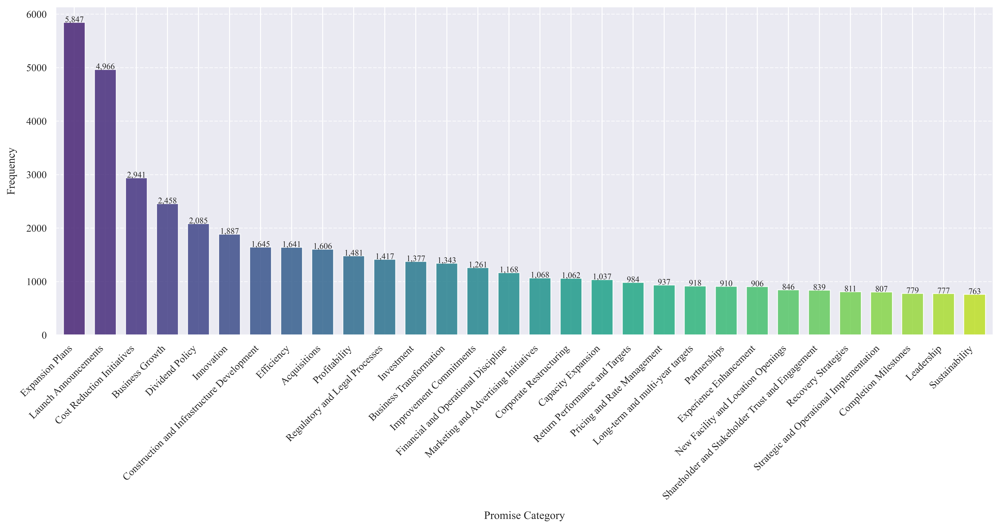

In [53]:
# Plot distribution of primary keywords (excluding "Unclustered")
top_n = 30
plt.figure(figsize=(15, 8), dpi=600)

# Get counts and filter out "Unclustered"
primary_keyword_counts = df["primary_keyword"].value_counts()
primary_keyword_counts = primary_keyword_counts[primary_keyword_counts.index != "Unclustered"]

# Create a colorful palette
colors = plt.cm.viridis(np.linspace(0.1, 0.9, top_n))

# Create bar plot with prettier styling
ax = primary_keyword_counts.head(top_n).plot(
    kind="bar", 
    color=colors,
    edgecolor='white',
    alpha=0.85,
    width=0.7
)

# Add value labels on top of each bar
for i, v in enumerate(primary_keyword_counts.head(top_n)):
    ax.text(i, v + 5, f"{v:,}", ha='center', fontsize=9)

# Customize plot appearance
plt.ylabel("Frequency", fontsize=12, labelpad=10)
plt.xlabel("Promise Category", fontsize=12, labelpad=10)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

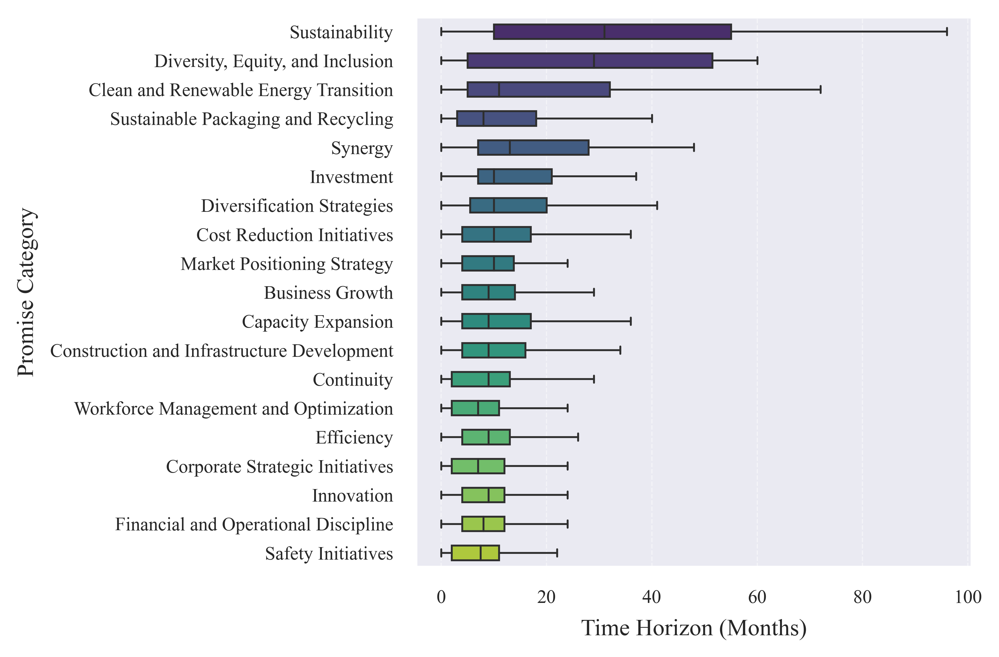

In [60]:
# Plot distribution of promise horizons for top 15 keywords by horizon mean
plt.figure(figsize=(6, 4), dpi=600)  # Reduced figure size for more compact appearance with high DPI

# Filter data for visualization
df_horizon = df.dropna(subset=["3-promise-horizon-clean"])
df_horizon = df_horizon[df_horizon["3-promise-horizon-clean"] <= 96]
df_horizon = df_horizon[df_horizon["primary_keyword"] != "Unclustered"]

# Calculate mean horizons for all keywords
mean_horizons = df_horizon.groupby('primary_keyword')['3-promise-horizon-clean'].mean()

# Filter data to include all select_primary_keywords
df_horizon = df_horizon[df_horizon["primary_keyword"].isin(select_primary_keywords)]

# Order all keywords by mean horizon (longest to shortest) and take top 15
ordered_keywords = mean_horizons.loc[select_primary_keywords].sort_values(ascending=False).index.tolist()[:19]

# Filter data to only include top 15 keywords
df_horizon = df_horizon[df_horizon["primary_keyword"].isin(ordered_keywords)]

# Create a colorful palette
colors = plt.cm.viridis(np.linspace(0.1, 0.9, len(ordered_keywords)))

# Create more compact box plot
ax = sns.boxplot(
    y="primary_keyword", 
    x="3-promise-horizon-clean", 
    data=df_horizon,
    palette=colors,
    width=0.5,  # Reduced width for more compact boxes
    fliersize=0,
    order=ordered_keywords,
    linewidth=0.8  # Thinner lines
)

# Customize plot appearance
plt.xlabel("Time Horizon (Months)", fontsize=10, labelpad=5)
plt.ylabel("Promise Category", fontsize=10, labelpad=5)
plt.yticks(fontsize=8)  # Smaller font for y-axis labels
plt.xticks(fontsize=8)  # Smaller font for x-axis labels
plt.grid(axis='x', linestyle='--', alpha=0.5, linewidth=0.5)  # Lighter grid
plt.tight_layout(pad=1.0)  # Tighter padding


In [63]:
# Average promise horizon by keyword
df_filtered = df[df['primary_keyword'] != 'Unclustered']
avg_horizon = df_filtered.groupby('primary_keyword')['3-promise-horizon-clean'].agg(['mean', 'median', 'std', 'count']).dropna()

# Sort by mean horizon in descending order
avg_horizon = avg_horizon.sort_values('mean', ascending=False)

print("\nAverage promise horizon by primary keyword:")
print(avg_horizon)

# Save to CSV
avg_horizon.reset_index().to_csv('../data/primary_keyword_avg_horizons.csv', index=False)
print(f"Saved primary keyword average horizons to '../data/primary_keyword_avg_horizons.csv'")



Average promise horizon by primary keyword:
                                             mean  median         std  count
primary_keyword                                                             
Sustainability                         117.313924   100.0  109.334664    395
Commitments                             58.747126    10.5  148.517274    174
Clean and Renewable Energy Transition   49.589404    17.0   77.114427    302
Diversity, Equity, and Inclusion        38.774194    36.0   36.651155     93
Electric Mobility and Electrification   32.848485    17.0   41.002530     66
...                                           ...     ...         ...    ...
Seasonal Business Strategy               4.052632     2.0    4.775013     57
Reporting Enhancements                   3.960526     2.0    6.520352    152
Disclosure Commitments                   3.500000     2.0    6.162558    154
Industry Conferences and Events          2.643725     1.0    3.660739    247
Investor Relations Events      


Average promise horizon by primary keyword:
                                             mean  median         std  count
primary_keyword                                                             
Sustainability                         117.313924   100.0  109.334664    395
Commitments                             58.747126    10.5  148.517274    174
Clean and Renewable Energy Transition   49.589404    17.0   77.114427    302
Diversity, Equity, and Inclusion        38.774194    36.0   36.651155     93
Electric Mobility and Electrification   32.848485    17.0   41.002530     66
...                                           ...     ...         ...    ...
Seasonal Business Strategy               4.052632     2.0    4.775013     57
Reporting Enhancements                   3.960526     2.0    6.520352    152
Disclosure Commitments                   3.500000     2.0    6.162558    154
Industry Conferences and Events          2.643725     1.0    3.660739    247
Investor Relations Events      

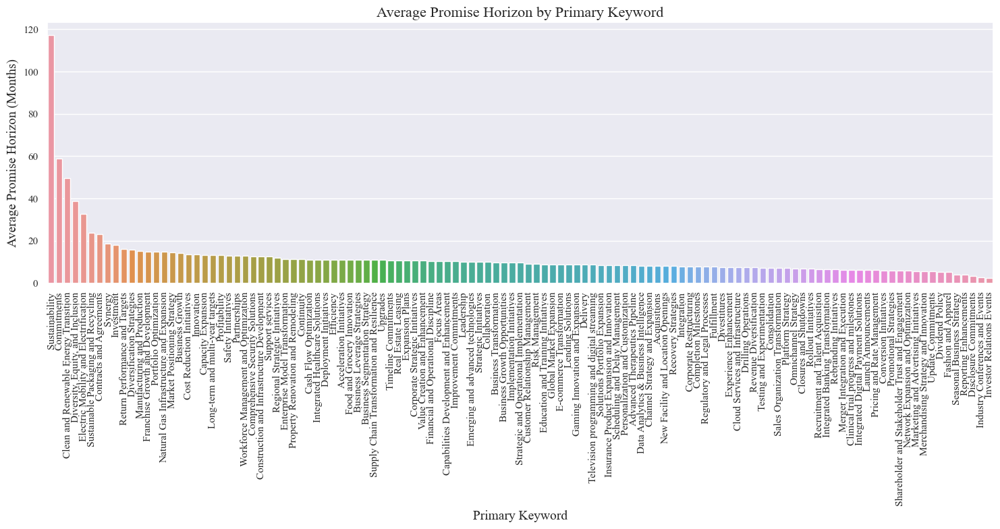

ANOVA for promise horizon by primary_keyword: F=95.86, p=0.0000


In [59]:
# Average promise horizon by keyword
df_filtered = df[df['primary_keyword'] != 'Unclustered']
avg_horizon = df_filtered.groupby('primary_keyword')['3-promise-horizon-clean'].agg(['mean', 'median', 'std', 'count']).dropna()
avg_horizon = avg_horizon.sort_values('mean', ascending=False)

print("\nAverage promise horizon by primary keyword:")
print(avg_horizon)

# Visualize average promise horizon by keyword
plt.figure(figsize=(15, 8))
ax = sns.barplot(x=avg_horizon.index, y=avg_horizon['mean'])
ax.set_title('Average Promise Horizon by Primary Keyword', fontsize=16)
ax.set_xlabel('Primary Keyword', fontsize=14)
ax.set_ylabel('Average Promise Horizon (Months)', fontsize=14)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# ANOVA test for promise horizon
from scipy import stats
groups = [df_filtered[df_filtered['primary_keyword'] == kw]['3-promise-horizon-clean'].dropna() 
         for kw in df_filtered['primary_keyword'].unique()]
groups = [group for group in groups if len(group) > 0]

if len(groups) > 1:
    f_val, p_val = stats.f_oneway(*groups)
    print(f"ANOVA for promise horizon by primary_keyword: F={f_val:.2f}, p={p_val:.4f}")
else:
    print("Not enough non-empty groups to perform ANOVA for promise horizon")

In [49]:
# Get frequency of each primary keyword
keyword_counts = df['primary_keyword'].value_counts().reset_index()
keyword_counts.columns = ['primary_keyword', 'frequency']

# Sort by frequency in descending order
keyword_counts = keyword_counts.sort_values('frequency', ascending=False)

# Save to CSV
keyword_counts.to_csv('../data/primary_keyword_frequencies.csv', index=False)

print(f"Saved primary keyword frequencies to '../data/primary_keyword_frequencies.csv'")

Saved primary keyword frequencies to '../data/primary_keyword_frequencies.csv'


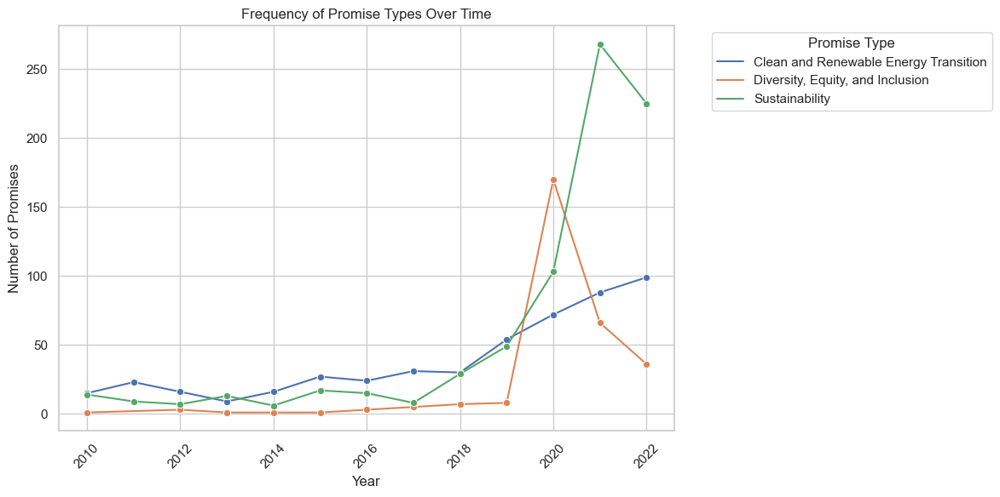

In [186]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your dataframe with the promises data
# Filter for the three specific labels
labels_of_interest = [
    'Sustainability',
    'Clean and Renewable Energy Transition',
    'Diversity, Equity, and Inclusion'
]

# Group by year and label, count occurrences
promises_by_year = df[df['primary_keyword'].isin(labels_of_interest)].groupby(
    ['year_x', 'primary_keyword'])['promise_id'].count().reset_index()

# Create the line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=promises_by_year, 
            x='year_x', 
            y='promise_id',
            hue='primary_keyword',
            marker='o')

plt.title('Frequency of Promise Types Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Promises')
plt.xticks(rotation=45)
plt.legend(title='Promise Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Functional Background Distribution:
functional_background
Operations/Supply Chain                   12080
Finance/Accounting                         4752
Sales/Marketing                            2205
Technology/Product/Engineering/Science      838
Strategy                                    771
Legal/Compliance/Regulatory/Risk            555
Administrative                              184
Human Resources                              33
Name: count, dtype: int64


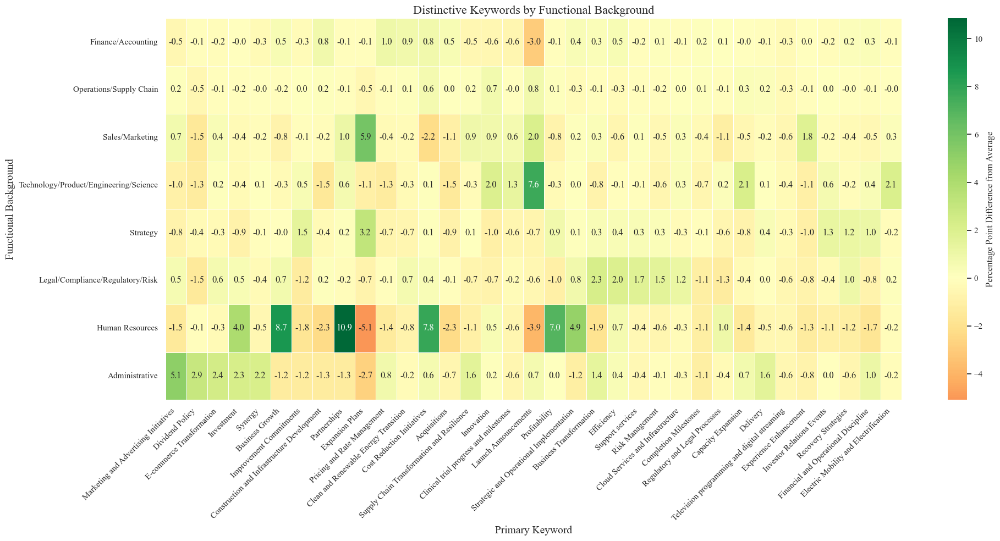

<Figure size 12000x6000 with 0 Axes>

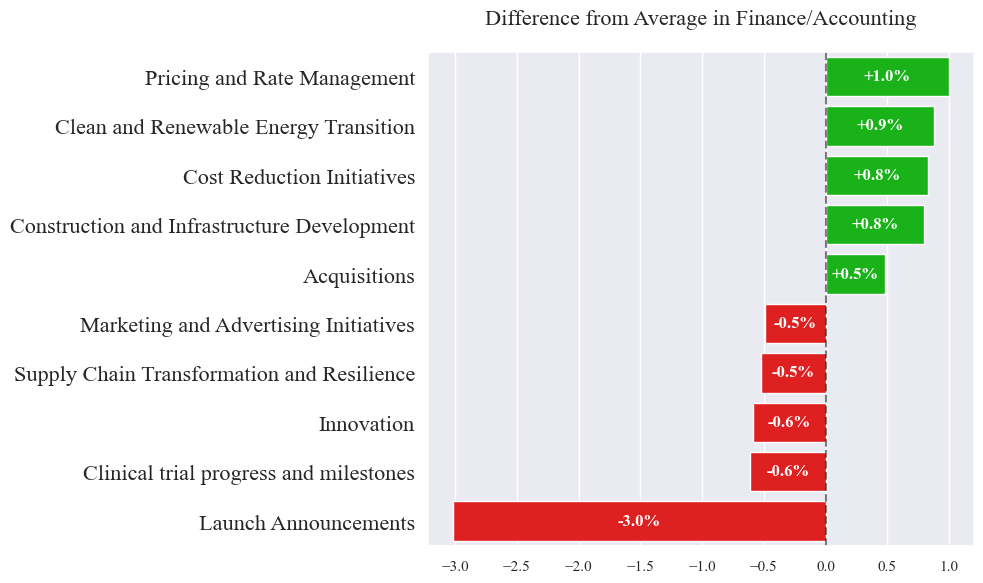

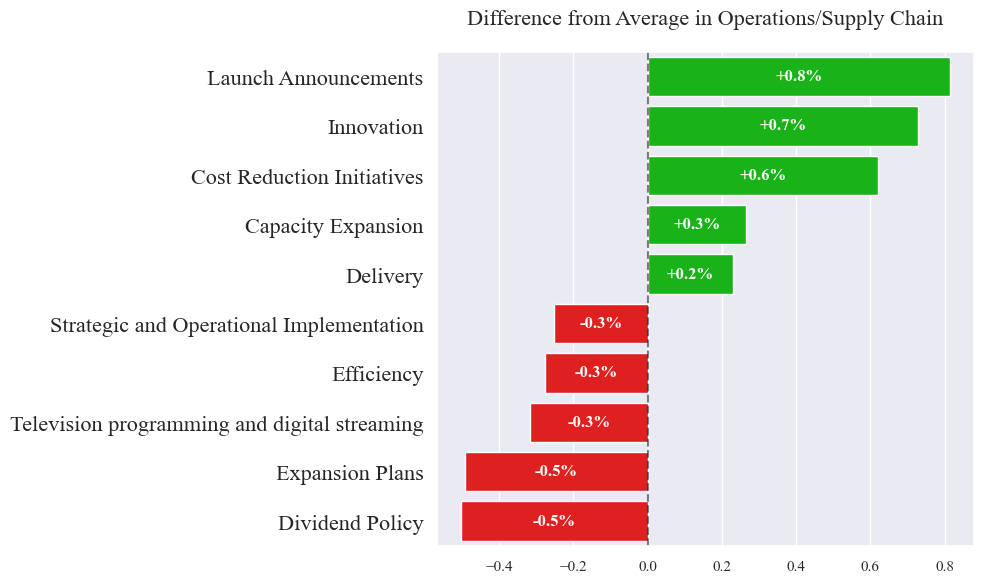

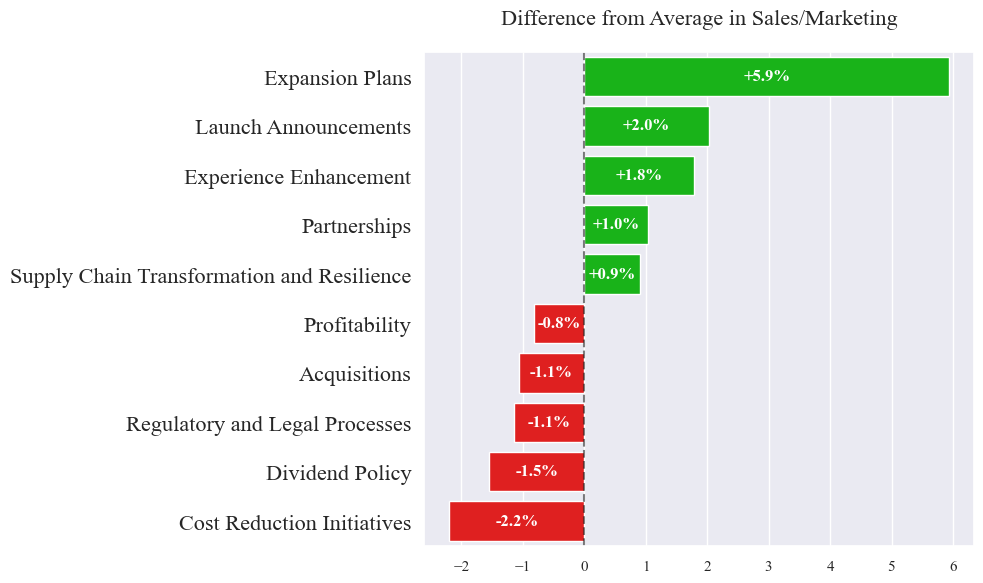

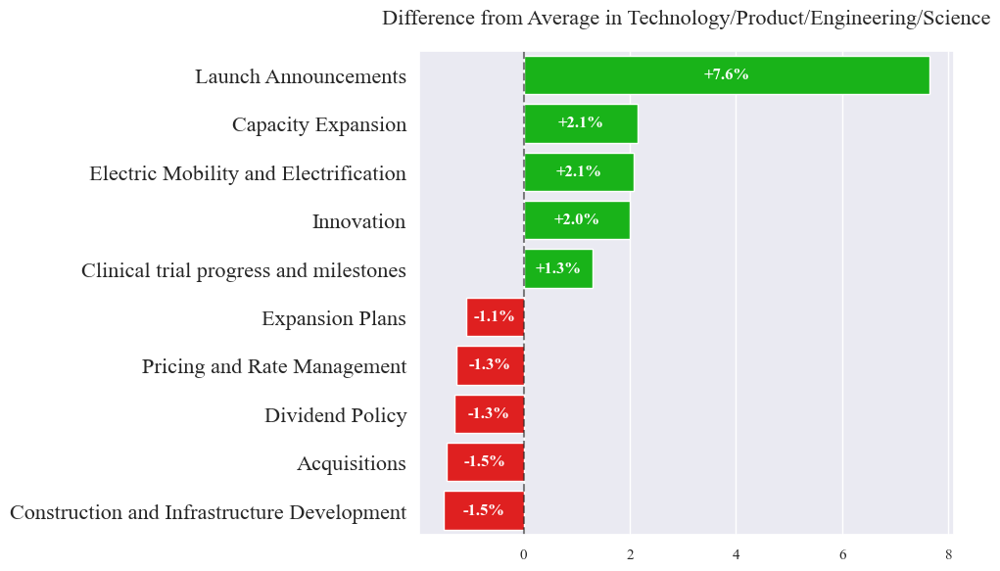

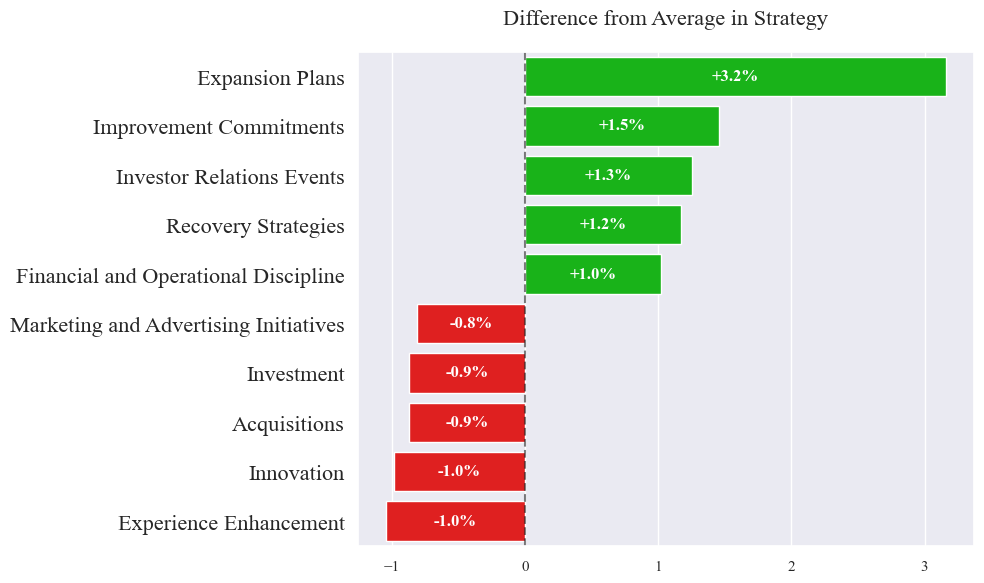

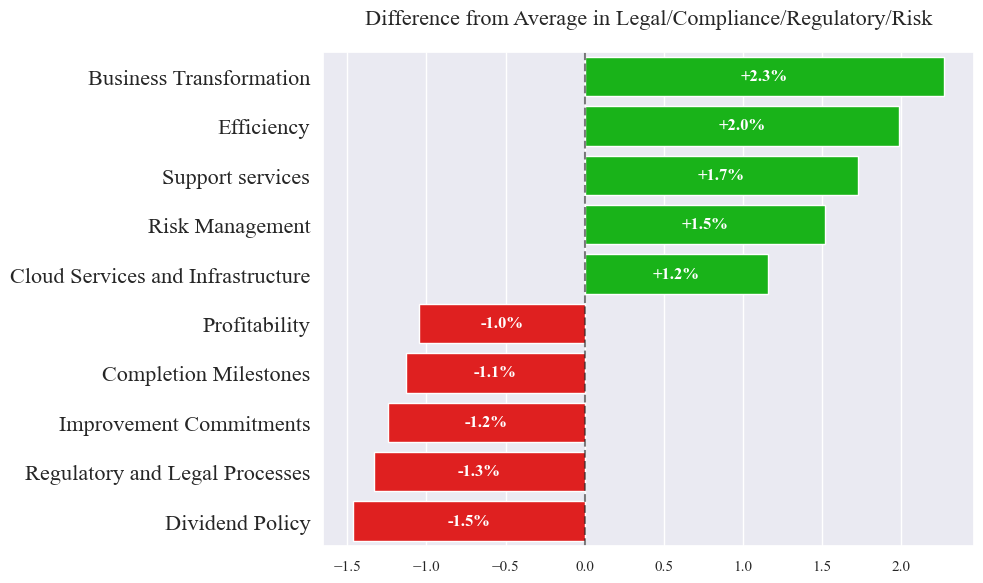

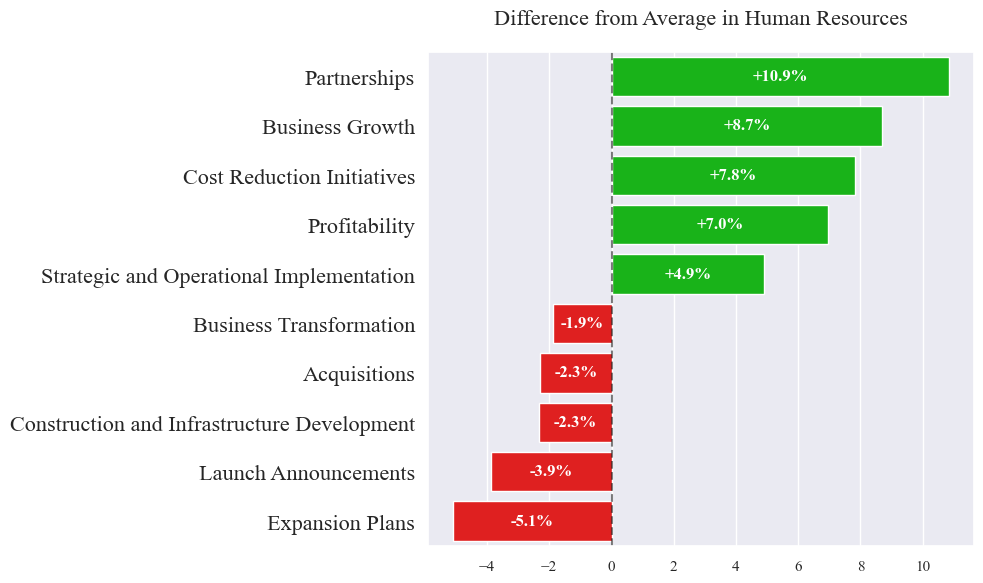

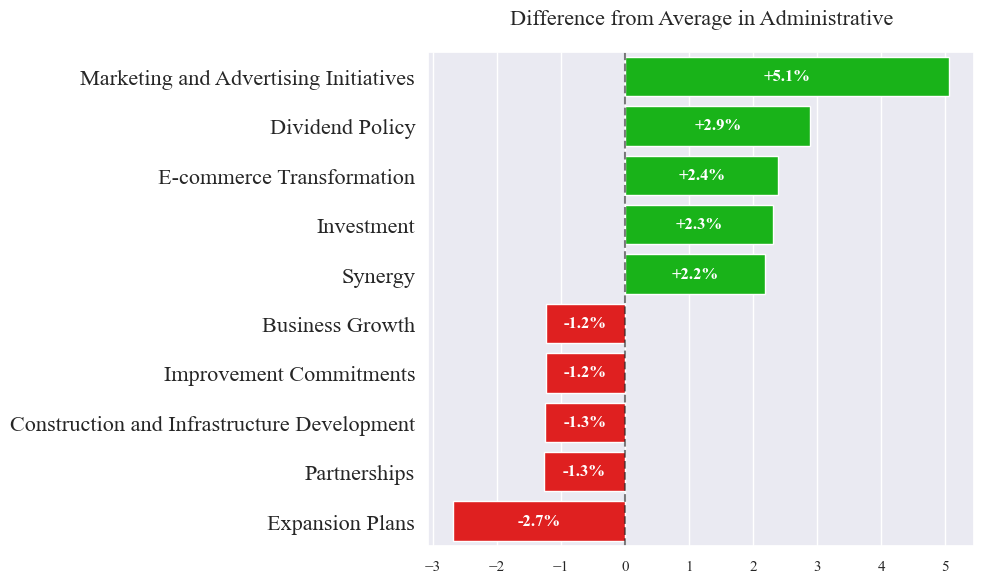


Promise counts by functional background:
functional_background
Operations/Supply Chain                   12080
Finance/Accounting                         4752
Sales/Marketing                            2205
Technology/Product/Engineering/Science      838
Strategy                                    771
Legal/Compliance/Regulatory/Risk            555
Administrative                              184
Human Resources                              33
dtype: int64

Percentages by Functional Background:
primary_keyword                         Acceleration Initiatives   
functional_background                                              
Administrative                                              0.00  \
Finance/Accounting                                          0.21   
Human Resources                                             0.00   
Legal/Compliance/Regulatory/Risk                            0.00   
Operations/Supply Chain                                     0.12   
Sales/Marketing         

In [99]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# Filter out unclustered and Other/Unclear
df_filtered = df[(df['primary_keyword'] != 'Unclustered') & 
                (df['functional_background'] != 'Other/Unclear')]

# Print distribution statistics
print("Functional Background Distribution:")
print(df_filtered['functional_background'].value_counts())

# Get all keywords that appear in any top 5 across functional backgrounds
all_top_keywords = set()
for background in df_filtered['functional_background'].unique():
    if pd.notna(background):  # Skip NaN values
        background_data = df_filtered[df_filtered['functional_background'] == background]
        top_5 = background_data['primary_keyword'].value_counts().head(5).index
        all_top_keywords.update(top_5)

# Calculate differences from overall average
cross_tab = pd.crosstab(df_filtered['functional_background'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

overall_percentages = df_filtered['primary_keyword'].value_counts() / len(df_filtered) * 100
differences_from_avg = {}

for background in cross_tab_pct.index:
    diff = cross_tab_pct.loc[background] - overall_percentages
    differences_from_avg[background] = diff.sort_values(ascending=False)

# Get top 5 most distinctive keywords for each functional background
distinctive_keywords = []
for background in differences_from_avg.keys():
    diff = differences_from_avg[background]
    top_5 = diff.head(5).index.tolist()
    bottom_5 = diff.tail(5).index.tolist()
    distinctive_keywords.extend(top_5)
    distinctive_keywords.extend(bottom_5)

# Remove duplicates while preserving order
distinctive_keywords = list(dict.fromkeys(distinctive_keywords))

# Create a dataframe with just the distinctive keywords
# Reorder the backgrounds as specified
ordered_backgrounds = [
    'Finance/Accounting',
    'Operations/Supply Chain',
    'Sales/Marketing',
    'Technology/Product/Engineering/Science',
    'Strategy',
    'Legal/Compliance/Regulatory/Risk',
    'Human Resources',
    'Administrative'
]

# Filter to only include backgrounds that exist in the data
ordered_backgrounds = [bg for bg in ordered_backgrounds if bg in differences_from_avg.keys()]

distinctive_df = pd.DataFrame(index=ordered_backgrounds, columns=distinctive_keywords)

# Fill the dataframe with the difference from average
for background in ordered_backgrounds:
    for keyword in distinctive_keywords:
        if keyword in differences_from_avg[background]:
            distinctive_df.loc[background, keyword] = float(differences_from_avg[background][keyword])
        else:
            distinctive_df.loc[background, keyword] = 0.0

# Convert all values to float to avoid dtype object error
distinctive_df = distinctive_df.astype(float)

# Plot the heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(distinctive_df, cmap="RdYlGn", center=0, annot=True, fmt=".1f", 
            linewidths=.5, cbar_kws={'label': 'Percentage Point Difference from Average'})
plt.title('Distinctive Keywords by Functional Background', fontsize=16)
plt.ylabel('Functional Background', fontsize=14)
plt.xlabel('Primary Keyword', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Create a more compact visualization for top keywords
plt.figure(figsize=(20, 10), dpi=600)
# Create a bar chart for each functional background
for i, background in enumerate(ordered_backgrounds):
    top_10 = differences_from_avg[background].head(5)
    bottom_10 = differences_from_avg[background].tail(5)
    combined = pd.concat([top_10, bottom_10])
    
    plt.figure(figsize=(10, 6))
    colors = ['#FF0000' if x < 0 else '#00CC00' if x > 0 else '#FFFFFF' for x in combined.values]
    ax = sns.barplot(x=combined.values, y=combined.index, palette=colors)
    
    plt.title(f'Difference from Average in {background}', fontsize=16, pad=20)
    
    # Add a vertical line at 0
    plt.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    
    # Add percentage labels inside the bars in white
    for i, v in enumerate(combined.values):
        # Position the text inside the bar
        text_x = v/2 if v > 0 else v/2
        plt.text(text_x, i, f'{v:+.1f}%', 
                va='center',
                ha='center',
                color='white',
                fontweight='bold')
    
    # Increase font size for y-axis labels (primary keywords)
    plt.yticks(fontsize=16)
    
    # Hide y-axis label
    plt.ylabel('')
    
    # Reduce whitespace
    plt.subplots_adjust(left=0.3, right=0.95, top=0.9, bottom=0.1)
    plt.tight_layout()
    plt.show()

# Print background statistics
print("\nPromise counts by functional background:")
print(df_filtered.groupby('functional_background').size().sort_values(ascending=False))

# Create cross-tabulation for all functional backgrounds
cross_tab = pd.crosstab(df_filtered['functional_background'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

# Print detailed percentages
print("\nPercentages by Functional Background:")
print(cross_tab_pct.round(2))

# Print the most distinctive keywords by functional background
print("\nMost distinctive keywords by functional background (largest differences from average):")
for background in ordered_backgrounds:
    print(f"\n{background}:")
    diff = differences_from_avg[background]
    print("Top 10 overrepresented:")
    print(diff.head(10))
    print("\nTop 10 underrepresented:")
    print(diff.tail(10))


In [121]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# Set high DPI for better quality
plt.rcParams['figure.dpi'] = 600

# Filter out unclustered and Other/Unclear
df_filtered = df[(df['primary_keyword'] != 'Unclustered') & 
                (df['functional_background'] != 'Other/Unclear')]

# Print distribution statistics
print("Functional Background Distribution:")
print(df_filtered['functional_background'].value_counts())

# Calculate differences from overall average
cross_tab = pd.crosstab(df_filtered['functional_background'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

overall_percentages = df_filtered['primary_keyword'].value_counts() / len(df_filtered) * 100
differences_from_avg = {}

for background in cross_tab_pct.index:
    diff = cross_tab_pct.loc[background] - overall_percentages
    differences_from_avg[background] = diff.sort_values(ascending=False)

# Reorder the backgrounds as specified
ordered_backgrounds = [
    'Finance/Accounting',
    'Operations/Supply Chain',
    'Sales/Marketing',
    'Technology/Product/Engineering/Science',
    'Human Resources',
    'Legal/Compliance/Regulatory/Risk',
    'Strategy',
    'Administrative'
]

# Filter to only include backgrounds that exist in the data
ordered_backgrounds = [bg for bg in ordered_backgrounds if bg in differences_from_avg.keys()]

# Create one figure with four rows, each containing 2 subplots
fig, axes = plt.subplots(4, 2, figsize=(18, 24))
axes = axes.flatten()

# Bolder blue color palette
blue_palette = ['#0052cc', '#0066ff', '#3385ff', '#66a3ff', '#99c2ff']

# Plot top 5 above average categories for each background
for i, background in enumerate(ordered_backgrounds):  # Include all backgrounds
    top_5_positive = differences_from_avg[background].head(5)  # Only top 5 above average
    
    # Skip if no positive differences
    if len(top_5_positive[top_5_positive > 0]) == 0:
        continue
    
    # Create bar plot in the corresponding subplot with thinner bars
    ax = sns.barplot(x=top_5_positive.values, y=top_5_positive.index, 
                    palette=blue_palette, ax=axes[i], width=0.6)
    
    axes[i].set_title(f'{background}', fontsize=16, fontweight='bold')
    axes[i].axvline(x=0, color='black', linestyle='--', alpha=0.5)
    
    # Add percentage labels inside the bars
    for j, v in enumerate(top_5_positive.values):
        axes[i].text(v/2, j, f'{v:+.1f}%', 
                va='center',
                ha='center',
                color='white',
                fontweight='bold',
                fontsize=14)
    
    # Formatting
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='y', labelsize=14)
    axes[i].tick_params(axis='x', labelsize=14)
    # Remove individual x-axis labels
    axes[i].set_xlabel('')

# Remove any unused subplots
for i in range(len(ordered_backgrounds), 8):
    fig.delaxes(axes[i])

# Add a common x-axis label for the entire figure
fig.text(0.5, 0.01, 'Percentage Points Above Average (%)', ha='center', fontsize=16, fontweight='bold')

plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.show()

# Print background statistics
print("\nPromise counts by functional background:")
print(df_filtered.groupby('functional_background').size().sort_values(ascending=False))

# Create cross-tabulation for all functional backgrounds
cross_tab = pd.crosstab(df_filtered['functional_background'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

# Print detailed percentages
print("\nPercentages by Functional Background:")
print(cross_tab_pct.round(2))

# Print the most distinctive keywords by functional background
print("\nMost distinctive keywords by functional background (largest differences from average):")
for background in ordered_backgrounds:
    print(f"\n{background}:")
    diff = differences_from_avg[background]
    print("Top 10 overrepresented:")
    print(diff.head(10))
    print("\nTop 10 underrepresented:")
    print(diff.tail(10))


Functional Background Distribution:
functional_background
Operations/Supply Chain                   12080
Finance/Accounting                         4752
Sales/Marketing                            2205
Technology/Product/Engineering/Science      838
Strategy                                    771
Legal/Compliance/Regulatory/Risk            555
Administrative                              184
Human Resources                              33
Name: count, dtype: int64



Promise counts by functional background:
functional_background
Operations/Supply Chain                   12080
Finance/Accounting                         4752
Sales/Marketing                            2205
Technology/Product/Engineering/Science      838
Strategy                                    771
Legal/Compliance/Regulatory/Risk            555
Administrative                              184
Human Resources                              33
dtype: int64

Percentages by Functional Background:
primary_keyword                         Acceleration Initiatives   
functional_background                                              
Administrative                                              0.00  \
Finance/Accounting                                          0.21   
Human Resources                                             0.00   
Legal/Compliance/Regulatory/Risk                            0.00   
Operations/Supply Chain                                     0.12   
Sales/Marketing         

In [169]:

# Print statistics
print("\nDetailed Statistics by Functional Background:")
stats = df_reg_all_transcripts_select.groupby('functional_background').agg({
    'promise_count': ['count', 'mean', 'std', 'min', 'max', 'median'],
    'execid': 'nunique'
}).round(2)
stats.columns = ['Number of Transcripts', 'Mean Promises/Transcript', 'Std Dev', 'Min', 'Max', 'Median', 'Number of CEOs']
print(stats.sort_values(('Mean Promises/Transcript'), ascending=False))


Detailed Statistics by Functional Background:
                                        Number of Transcripts   
functional_background                                           
Sales/Marketing                                          1696  \
Strategy                                                  646   
Technology/Product/Engineering/Science                    774   
Operations/Supply Chain                                 11594   
Administrative                                            188   
Finance/Accounting                                       4791   
Legal/Compliance/Regulatory/Risk                          566   
Other/Unclear                                           12472   
Human Resources                                            42   

                                        Mean Promises/Transcript  Std Dev   
functional_background                                                       
Sales/Marketing                                             1.36     1.67  \
Strate

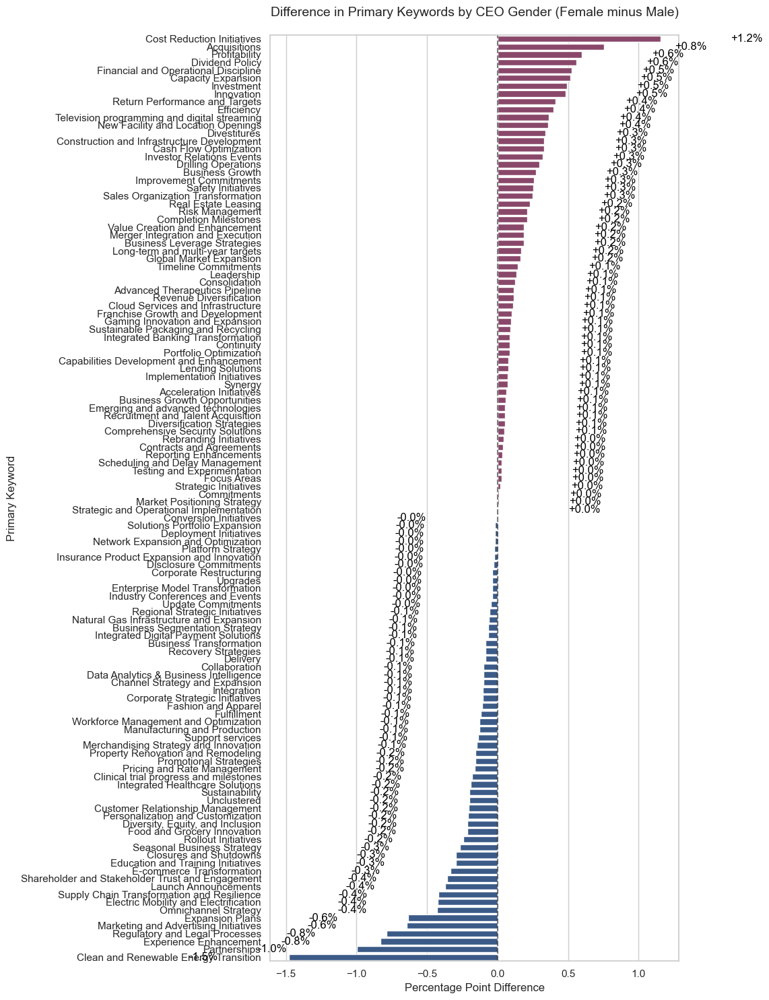


Detailed percentage differences (Female minus Male):
                                   keyword  difference
0               Cost Reduction Initiatives        1.15
1                             Acquisitions        0.75
2                            Profitability        0.60
3                          Dividend Policy        0.56
4     Financial and Operational Discipline        0.53
..                                     ...         ...
113  Marketing and Advertising Initiatives       -0.64
114         Regulatory and Legal Processes       -0.79
115                 Experience Enhancement       -0.83
116                           Partnerships       -0.99
117  Clean and Renewable Energy Transition       -1.48

[118 rows x 2 columns]

Total promises by gender:
Male CEOs: 4,436 promises
Female CEOs: 69,188 promises

Percentages for each gender:

Male CEOs:
primary_keyword
Acceleration Initiatives                 0.11
Acquisitions                             1.47
Advanced Therapeutics Pipeline

In [172]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# Filter out unclustered
df_filtered = df[df['primary_keyword'] != 'unclustered']

# Create cross-tabulation of gender vs primary keyword
cross_tab = pd.crosstab(df_filtered['ceo_gender_dummy'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

# Calculate the difference in percentage points (Female minus Male)
diff = cross_tab_pct.loc[1] - cross_tab_pct.loc[0]
diff = diff.sort_values(ascending=False)

# Create a dataframe for the plot
diff_df = pd.DataFrame({
    'keyword': diff.index,
    'difference': diff.values
})

# Visualize the differences
plt.figure(figsize=(12, 15))
colors = ['#2E5894' if x < 0 else '#943D6B' for x in diff_df['difference']]
ax = sns.barplot(x='difference', y='keyword', data=diff_df, palette=colors)

# Customize the plot
ax.set_title('Difference in Primary Keywords by CEO Gender (Female minus Male)', fontsize=14, pad=20)
ax.set_xlabel('Percentage Point Difference', fontsize=12)
ax.set_ylabel('Primary Keyword', fontsize=12)

# Add a vertical line at 0
plt.axvline(x=0, color='black', linestyle='--', alpha=0.5)

# Add percentage labels on the bars
for i, v in enumerate(diff_df['difference']):
    ax.text(v + (0.5 if v > 0 else -0.5), i, 
            f'{v:+.1f}%', 
            va='center',
            ha='left' if v > 0 else 'right',
            color='black')

plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed percentage differences (Female minus Male):")
print(diff_df.round(2))

print("\nTotal promises by gender:")
print(f"Male CEOs: {len(df_filtered[df_filtered['ceo_gender_dummy'] == 0]):,} promises")
print(f"Female CEOs: {len(df_filtered[df_filtered['ceo_gender_dummy'] == 1]):,} promises")

# Print the actual percentages for both genders
print("\nPercentages for each gender:")
print("\nMale CEOs:")
print(cross_tab_pct.loc[0].round(2))
print("\nFemale CEOs:")
print(cross_tab_pct.loc[1].round(2))

In [134]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# Set high DPI for better quality
plt.rcParams['figure.dpi'] = 600

# Filter out unclustered
df_filtered = df[(df['primary_keyword'] != 'Unclustered') & 
                (df['industry_label'].notna())]

# Print distribution statistics
print("Industry Distribution:")
print(df_filtered['industry_label'].value_counts())

# Calculate differences from overall average
cross_tab = pd.crosstab(df_filtered['industry_label'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

overall_percentages = df_filtered['primary_keyword'].value_counts() / len(df_filtered) * 100
differences_from_avg = {}

for industry in cross_tab_pct.index:
    diff = cross_tab_pct.loc[industry] - overall_percentages
    differences_from_avg[industry] = diff.sort_values(ascending=False)

# Get ordered list of industries
ordered_industries = sorted(differences_from_avg.keys())

# Create one figure with four rows, each containing 2 subplots
fig, axes = plt.subplots(4, 2, figsize=(18, 24))
axes = axes.flatten()

# Bold green color palette
green_palette = ['#006400', '#008000', '#228B22', '#32CD32', '#3CB371']

# Plot top 5 above average categories for each industry
for i, industry in enumerate(ordered_industries):
    if i >= len(axes):
        break
        
    top_5_positive = differences_from_avg[industry].head(5)  # Only top 5 above average
    
    # Skip if no positive differences
    if len(top_5_positive[top_5_positive > 0]) == 0:
        continue
    
    # Create bar plot in the corresponding subplot with thinner bars
    ax = sns.barplot(x=top_5_positive.values, y=top_5_positive.index, 
                    palette=green_palette, ax=axes[i], width=0.6)
    
    axes[i].set_title(f'{industry}', fontsize=16, fontweight='bold')
    axes[i].axvline(x=0, color='black', linestyle='--', alpha=0.5)
    
    # Add percentage labels inside the bars
    for j, v in enumerate(top_5_positive.values):
        axes[i].text(v/2, j, f'{v:+.1f}%', 
                va='center',
                ha='center',
                color='white',
                fontweight='bold',
                fontsize=14)
    
    # Formatting
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='y', labelsize=14)
    axes[i].tick_params(axis='x', labelsize=14)
    # Remove individual x-axis labels
    axes[i].set_xlabel('')

# Remove any unused subplots
for i in range(min(len(ordered_industries), 8), 8):
    fig.delaxes(axes[i])

# Add a common x-axis label for the entire figure
fig.text(0.5, 0.01, 'Percentage Points Above Average (%)', ha='center', fontsize=16, fontweight='bold')

plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.show()

# Print industry statistics
print("\nPromise counts by industry:")
print(df_filtered.groupby('industry_label').size().sort_values(ascending=False))

# Create cross-tabulation for all industries
cross_tab = pd.crosstab(df_filtered['industry_label'], df_filtered['primary_keyword'])
cross_tab_pct = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

# Print detailed percentages
print("\nPercentages by Industry:")
print(cross_tab_pct.round(2))

# Print the most distinctive keywords by industry
print("\nMost distinctive keywords by industry (largest differences from average):")
for industry in ordered_industries:
    print(f"\n{industry}:")
    diff = differences_from_avg[industry]
    print("Top 10 overrepresented:")
    print(diff.head(10))
    print("\nTop 10 underrepresented:")
    print(diff.tail(10))

Industry Distribution:
industry_label
Manufacturing                        28939
Finance, Insurance, Real Estate      11293
Services                              9860
Transportation & Public Utilities     7007
Retail Trade                          6844
Mining                                3240
Wholesale Trade                       2052
Construction                           863
nan                                    467
Public Administration                   87
Name: count, dtype: int64



Promise counts by industry:
industry_label
Manufacturing                        28939
Finance, Insurance, Real Estate      11293
Services                              9860
Transportation & Public Utilities     7007
Retail Trade                          6844
Mining                                3240
Wholesale Trade                       2052
Construction                           863
nan                                    467
Public Administration                   87
dtype: int64

Percentages by Industry:
primary_keyword                    Acceleration Initiatives  Acquisitions   
industry_label                                                              
Construction                                           0.23          4.06  \
Finance, Insurance, Real Estate                        0.14          3.81   
Manufacturing                                          0.16          1.92   
Mining                                                 0.46          1.30   
Public Administration    